# Programa base Hit & Miss

Área estimada da região de interseção: 2.231119


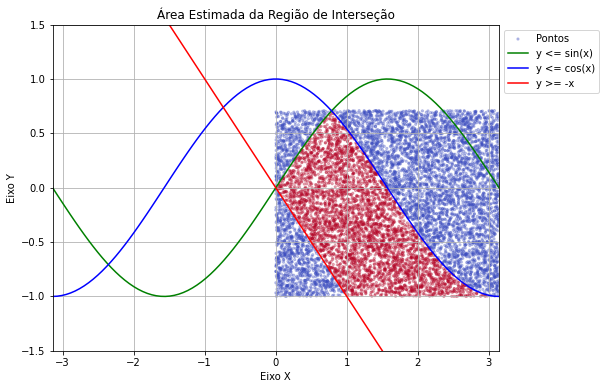

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from math import *

# Função para verificar se um ponto está dentro da região de interseção das três curvas
def esta_dentro_da_regiao(x, y):
    # Definindo as três curvas
    curva1 = y <= sin(x)
    curva2 = y <= cos(x)
    curva3 = y >= -x
    
    # Verificando se o ponto está dentro da região de interseção das três curvas
    dentro_da_regiao = curva1 and curva2 and curva3      # Retorna True or False
    
    return dentro_da_regiao

# Método Hit e Miss + retorno de dados p/ gerar plot do gráfico
def Hit_e_Miss(N):
    # Geração de pontos aleatórios
    x_pontos = np.random.uniform( 0, pi, N)
    y_pontos = np.random.uniform(-1, 0.71, N)

    # Verificar se os pontos estão dentro da região de interseção das curvas  (Lista de True or False)
    pontos_dentro_da_regiao = [esta_dentro_da_regiao(x, y) for x, y in zip(x_pontos, y_pontos)]

    # Área estimada da região de interseção
    def amplitude_vetor(vet): return abs(np.max(vet))+abs(np.min(vet))
    fator_area = amplitude_vetor(x_pontos)*amplitude_vetor(y_pontos) # Área do quadrado de Chute
    area_estimada = (sum(pontos_dentro_da_regiao) / N) * fator_area
    return x_pontos, y_pontos, pontos_dentro_da_regiao, area_estimada

''' -------------------------------------------------------------------------------- user: '''

# Chama Função Hit_e_Miss
x_pontos, y_pontos, pontos_dentro_da_regiao, area_estimada = Hit_e_Miss(N = 10000)

# Mostrar resultado
print("Área estimada da região de interseção:", round(area_estimada,6))

# Plot dos pontos e das curvas
plt.figure(figsize=(8, 6))
plt.scatter(x_pontos, y_pontos, c=pontos_dentro_da_regiao, cmap='coolwarm', s=5, alpha=0.3, label='Pontos')
eixo_x = np.linspace(-pi, pi, 100)
plt.plot(eixo_x, [sin(x) for x in np.linspace(-pi, pi, 100)], color='green', label='y <= sin(x)')
plt.plot(eixo_x, [cos(x) for x in np.linspace(-pi, pi, 100)], color='blue',  label='y <= cos(x)')
plt.plot(eixo_x, [-x for x in np.linspace(-pi, pi, 100)],     color='red',   label='y >= -x')
plt.xlim(-pi, pi); plt.ylim(-1.5, 1.5)
plt.title('Área Estimada da Região de Interseção')
plt.xlabel('Eixo X'); plt.ylabel('Eixo Y')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.grid(True); plt.show()


### Questão 1. Ítem 1)  Mostrar a convergência com N = {100,   ... 10⁷}

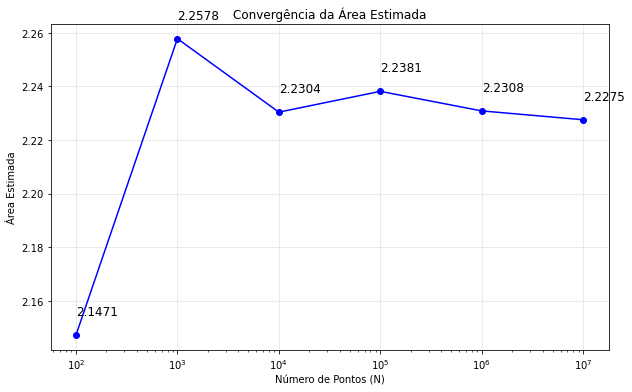

In [3]:
# Valores de N para teste
valores_N = [10**2, 10**3, 10**4, 10**5, 10**6, 10**7]

# Lista para armazenar as áreas estimadas para cada valor de N
areas_estimadas = []
for N in valores_N:
    _, _, _, area = Hit_e_Miss(N)
    areas_estimadas.append(area)
    
# Plot dos resultados usando o Matplotlib
plt.figure(figsize=(10, 6))
plt.plot(valores_N, areas_estimadas, marker='o', linestyle='-', color='b')
plt.xlabel('Número de Pontos (N)'); plt.ylabel('Área Estimada'); plt.title('Convergência da Área Estimada')
plt.grid(True, alpha=0.3); plt.xscale('log')
for i, txt in enumerate(areas_estimadas):
    plt.annotate(f'{txt:.4f}', (valores_N[i], areas_estimadas[i]), textcoords="offset points", 
                 xytext=(0,20), ha='left', fontsize=12)
plt.show()

### Questão 1. Ítem 2)  Comparar gerador de congruência com gerador de Python

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


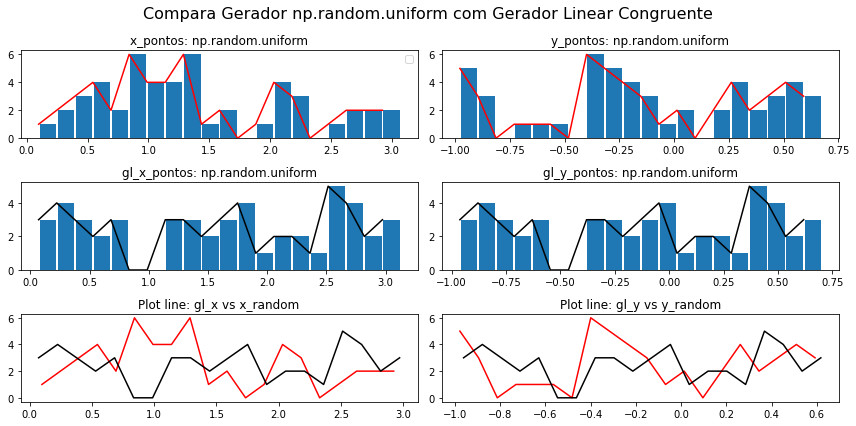

In [20]:
# Definindo a função Geradora de Congruência Linear
def gerador_linear(seed, size):
    a = 1664525; b = 1013904223; m = 2**32; 
    numbers = []; x = seed;
    for _ in range(size):
        x = (a*x + b) % m
        numbers.append(x / m)
    return np.array(numbers)

def plot_compara_geradores(seed, N):
    # Gerando os pontos com as diferentes funções geradoras
    x_pontos = np.random.uniform( 0, pi, N)
    y_pontos = np.random.uniform(-1, 0.71, N)
    gl_x_pontos = gerador_linear(seed, N)*pi
    gl_y_pontos = gerador_linear(seed, N)*(1 + 0.71) - 1
    # Ambiente de plot
    plt.figure(figsize=(12,6))
    plt.suptitle('Compara Gerador np.random.uniform com Gerador Linear Congruente', fontsize=16)
    
    plt.subplot(3,2,1)
    hist_x = plt.hist(x_pontos, bins=20, rwidth=0.9)
    plt.plot(hist_x[1][:-1], hist_x[0], color='r')
    plt.title('x_pontos: np.random.uniform'); plt.legend()

    plt.subplot(3,2,2)
    hist_y = plt.hist(y_pontos, bins=20, rwidth=0.9)
    plt.plot(hist_y[1][:-1], hist_y[0], color='r')
    plt.title('y_pontos: np.random.uniform');

    plt.subplot(3,2,3)
    hist_gl_x = plt.hist(gl_x_pontos, bins=20, rwidth=0.9)
    plt.plot(hist_gl_x[1][:-1], hist_gl_x[0], color='black')
    plt.title('gl_x_pontos: np.random.uniform'); 
    
    plt.subplot(3,2,4)
    hist_gl_y = plt.hist(gl_y_pontos, bins=20, rwidth=0.9)
    plt.plot(hist_gl_y[1][:-1], hist_gl_y[0], color='black')
    plt.title('gl_y_pontos: np.random.uniform');   
               
    plt.subplot(3,2,5)
    plt.plot(hist_x[1][:-1], hist_x[0], color='r')
    plt.plot(hist_gl_x[1][:-1], hist_gl_x[0], color='black')    
    plt.title('Plot line: gl_x vs x_random');       

    plt.subplot(3,2,6)
    plt.plot(hist_y[1][:-1], hist_y[0], color='r', label='Topo das barras')
    plt.plot(hist_gl_y[1][:-1], hist_gl_y[0], color='black', label='Topo das barras')    
    plt.title('Plot line: gl_y vs y_random');  
    
    plt.tight_layout(); plt.show()

plot_compara_geradores(seed = 42, N = 10*5)  

In [21]:
# Método Hit e Miss + retorno de dados para gerar o gráfico
def Hit_e_Miss(seed, N, gerador):
    if gerador == 'gl': # Gerador Congruente Linear
        x_pontos = (gerador_linear(seed, N)*2 - 1)*pi
        y_pontos = gerador_linear(seed, N)*1.85 - 1
    if gerador == 'uniform': # Gerador np.random.uniform
        x_pontos = np.random.uniform( 0, pi, N)
        y_pontos = np.random.uniform(-1, 0.71, N)
    if gerador == 'rand': # Gerador np.random.rand
        x_pontos = (np.random.rand(N)*2 - 1)*pi
        y_pontos = np.random.rand(N)*1.71 - 1
        
    # Verificar se os pontos estão dentro da região de interseção das curvas  (Lista de True or False)
    pontos_dentro_da_regiao = [esta_dentro_da_regiao(x, y) for x, y in zip(x_pontos, y_pontos)]

    # Área estimada da região de interseção
    def amplitude_vetor(vet): return abs(np.max(vet))+abs(np.min(vet))
    fator_area = amplitude_vetor(x_pontos)*amplitude_vetor(y_pontos) # Área do quadrado de Chute
    area_estimada = (sum(pontos_dentro_da_regiao) / N) * fator_area
    return area_estimada

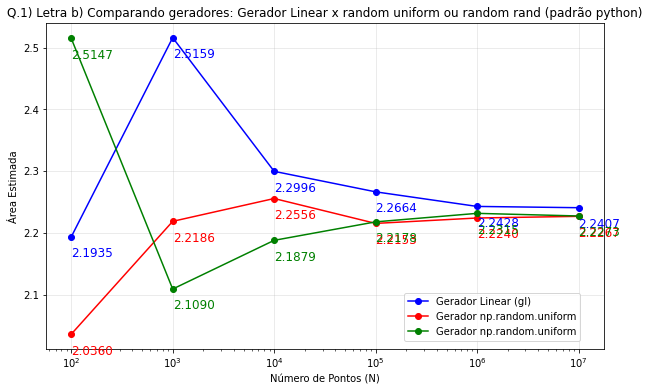

In [28]:
# Valores de N para teste
valores_N = [10**2, 10**3, 10**4, 10**5, 10**6, 10**7]; seed = 4200

# Lista para armazenar as áreas estimadas para cada valor de N
areas_gl      = [ Hit_e_Miss(seed, N, gerador = 'gl') for N in valores_N ]
areas_uniform = [ Hit_e_Miss(seed, N, gerador = 'uniform') for N in valores_N ]
areas_rand    = [ Hit_e_Miss(seed, N, gerador = 'rand') for N in valores_N ]
    
# Plot dos resultados usando o Matplotlib
plt.figure(figsize=(10, 6))
plt.plot(valores_N, areas_gl, marker='o', linestyle='-', color='b', label='Gerador Linear (gl)')
plt.plot(valores_N, areas_uniform, marker='o', linestyle='-', color='r', label='Gerador np.random.uniform')
plt.plot(valores_N, areas_rand, marker='o', linestyle='-', color='g', label='Gerador np.random.uniform')
plt.xlabel('Número de Pontos (N)'); plt.ylabel('Área Estimada'); 
plt.title('Q.1) Letra b) Comparando geradores: Gerador Linear x random uniform ou random rand (padrão python)')
plt.grid(True, alpha=0.3); plt.xscale('log')
for i in range(0, len(areas_gl)):
    plt.annotate(f'{areas_gl[i]:.4f}', (valores_N[i], areas_gl[i]), textcoords="offset points", 
                 xytext=(0,-20), color='b', ha='left', fontsize=12)
    plt.annotate(f'{areas_uniform[i]:.4f}', (valores_N[i], areas_uniform[i]), textcoords="offset points", 
                 xytext=(0,-20), color='r', ha='left', fontsize=12)
    plt.annotate(f'{areas_rand[i]:.4f}', (valores_N[i], areas_rand[i]), textcoords="offset points", 
                 xytext=(0,-20), color='g', ha='left', fontsize=12)    
    
plt.legend(loc='lower center', bbox_to_anchor=(0.8, 0.01)); plt.show()

# Questão 2: Estatística de um jogo

### Estatísticas do Jogo "Lançamento de Dado"

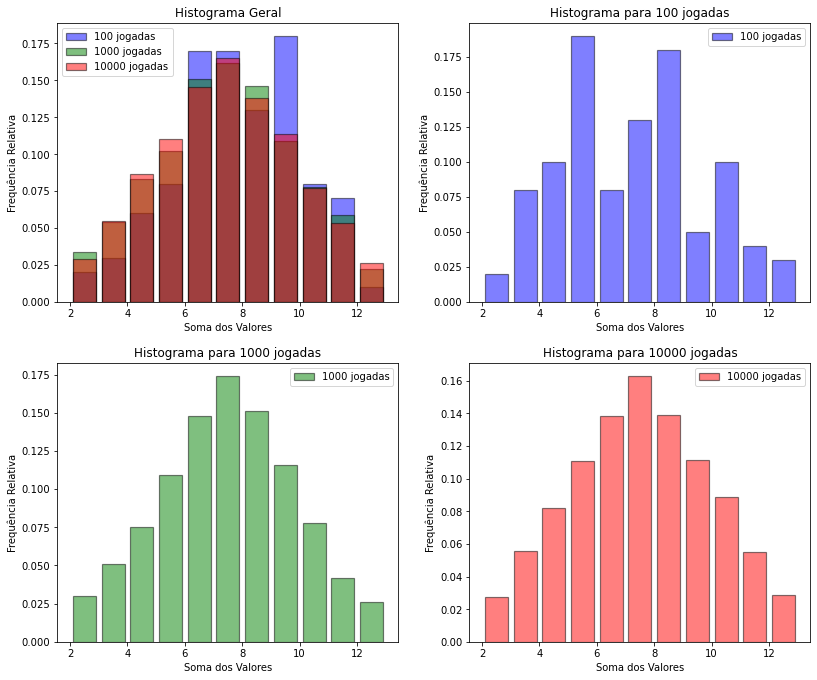

In [4]:
import numpy as np
import matplotlib.pyplot as plt

def jogo(num_jogadas):
    dados = np.random.randint(1, 7, size=(num_jogadas, 2))
    soma = np.sum(dados, axis=1)
    return soma

N = [100, 1000, 10000]    # Número de jogadas em cada experimento
cores = ['blue', 'green', 'red'] # Cores para padronizar gráficos

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 10))
fig.tight_layout(pad=4.0)
axes = axes.flatten()

# Histograma Geral (3 casos juntos)
for idx, num_jogadas in enumerate(N):
    resultados = jogo(num_jogadas)
    axes[0].hist(resultados, bins=range(2, 14), density=True, alpha=0.5, label=f'{num_jogadas} jogadas', edgecolor='black', linewidth=1.2, histtype='bar', align='mid', rwidth=0.8, color=cores[idx])
axes[0].set_title('Histograma Geral')
axes[0].set_xlabel('Soma dos Valores')
axes[0].set_ylabel('Frequência Relativa')
axes[0].legend()
# axes[0].grid(True)

# Gráficos Separados
for idx, num_jogadas in enumerate(N):
    resultados = jogo(num_jogadas)
    axes[idx + 1].hist(resultados, bins=range(2, 14), density=True, alpha=0.5, label=f'{num_jogadas} jogadas', edgecolor='black', linewidth=1.2, histtype='bar', align='mid', rwidth=0.8, color=cores[idx])
    axes[idx + 1].set_title(f'Histograma para {num_jogadas} jogadas')
    axes[idx + 1].set_xlabel('Soma dos Valores')
    axes[idx + 1].set_ylabel('Frequência Relativa')
    axes[idx + 1].legend()

plt.show()

### Estatísticas do Jogo "Lançamento de Moeda"

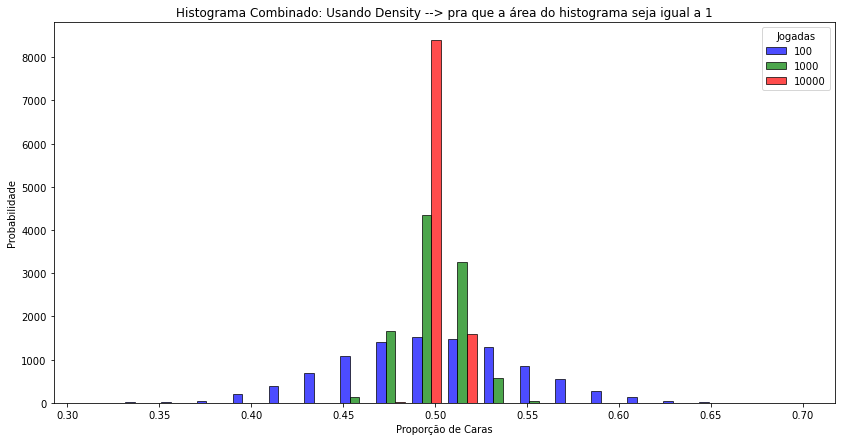

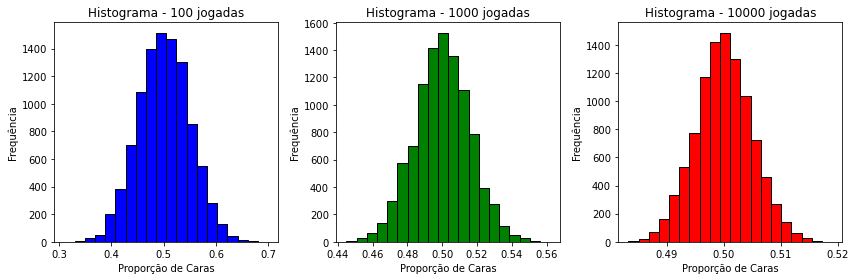

In [29]:
import numpy as np
import matplotlib.pyplot as plt

def simulacao_moedas(jogadas, total_simulacoes):
    resultados = np.random.randint(2, size=(total_simulacoes, jogadas))  # Simulação das jogadas de moedas
    proporcoes_caras = np.mean(resultados, axis=1)  # Calcular a proporção de caras em cada simulação
    return proporcoes_caras

jogadas = [100, 1000, 10000]       # Número de jogadas
total_simulacoes = 10000           # Número total de simulações
cores = ['blue', 'green', 'red']   # Cores para padronizar gráficos

# Simular o jogo de moedas para cada número de jogadas
resultados_por_jogadas = []
for num_jogadas in jogadas:
    resultados = simulacao_moedas(num_jogadas, total_simulacoes)
    resultados_por_jogadas.append(resultados)

# Criar um histograma combinado para todos os casos
plt.figure(figsize=(14, 7))
plt.hist(resultados_por_jogadas, bins=20, color=cores,density=True, label=jogadas, edgecolor='black', alpha=0.7)
plt.title('Histograma Combinado: Usando Density --> pra que a área do histograma seja igual a 1')
plt.xlabel('Proporção de Caras'); plt.ylabel('Probabilidade'); plt.legend(title='Jogadas')

# Criar subplots para cada número de jogadas
fig, axs = plt.subplots(1, len(jogadas), figsize=(12, 4))
for i, num_jogadas in enumerate(jogadas):
    axs[i].hist(resultados_por_jogadas[i], bins=20, color=cores[i], edgecolor='black')
    axs[i].set_title(f'Histograma - {num_jogadas} jogadas')
    axs[i].set_xlabel('Proporção de Caras')
    axs[i].set_ylabel('Frequência')

plt.tight_layout(); plt.show()

### Estatísticas do Jogo "Lançamento de Roleta"

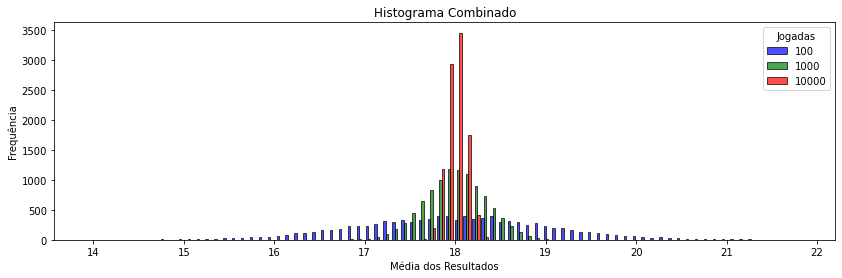

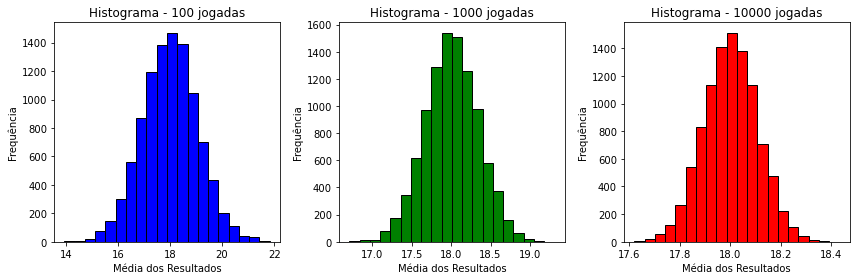

In [30]:
import numpy as np
import matplotlib.pyplot as plt

def simulacao_roleta(jogadas, total_simulacoes):
    resultados = np.random.randint(37, size=(total_simulacoes, jogadas))  # Simulação das jogadas de roleta
    media_resultados = np.mean(resultados, axis=1)  # Calcular a média dos resultados em cada simulação
    return media_resultados

jogadas = [100, 1000, 10000]       # Número de jogadas
total_simulacoes = 10000           # Número total de simulações
cores = ['blue', 'green', 'red']   # Cores para padronizar gráficos

# Simular o jogo de roleta para cada número de jogadas
resultados_por_jogadas = []
for num_jogadas in jogadas:
    resultados = simulacao_roleta(num_jogadas, total_simulacoes)
    resultados_por_jogadas.append(resultados)

# Criar um histograma combinado para todos os casos
plt.figure(figsize=(14, 4))
plt.hist(resultados_por_jogadas, bins=80, color=cores, label=jogadas, edgecolor='black', alpha=0.7)
plt.title('Histograma Combinado');plt.xlabel('Média dos Resultados'); plt.ylabel('Frequência'); 
plt.legend(title='Jogadas')

# Criar subplots para cada número de jogadas
fig, axs = plt.subplots(1, len(jogadas), figsize=(12, 4))
for i, num_jogadas in enumerate(jogadas):
    axs[i].hist(resultados_por_jogadas[i], bins=20, color=cores[i], edgecolor='black')
    axs[i].set_title(f'Histograma - {num_jogadas} jogadas')
    axs[i].set_xlabel('Média dos Resultados')
    axs[i].set_ylabel('Frequência')

plt.tight_layout(); plt.show()

___
___
___

## Questão 3: Cálculo de desvio padrão (flutuação) do modelo do gás 

#### Primeiro, tentando fazer pelo escopo mostrado nos slides da disciplina

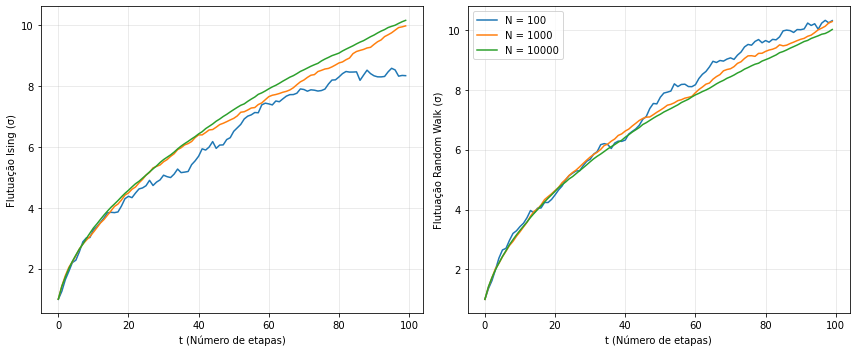

In [47]:
import numpy as np
import matplotlib.pyplot as plt
from random import *

def caminhada_aleatoria_1D(N, t_max):
    passos = 2 * np.random.randint(0, 2, (N, t_max)) - 1
    return np.cumsum(passos, axis=1)  # Soma Cumulativa de todos passos

# Modelo baseado no escopo q está nos slides da disciplina
def ising_1D(t_max, N): 
    array_box = []
    for _ in range(t_max):
        box = [-1] * N
        N_direita = 0
        flutuacoes = []
        for _ in range(t_max):
            i = int(N*random())
            box[i] = -box[i]
            N_direita += box[i]
        array_box.append(box)
    return np.cumsum(np.array(array_box), axis=1)  

def flutuacao(posicoes):
    media_quadratica = np.mean(posicoes**2, axis=0)
    media = np.mean(posicoes, axis=0)
    return np.sqrt(media_quadratica - media**2)

''' --------------------------------------------------------------- User: '''

t_max = 100; valores_N = [100, 1_000, 10_000]

flutuacoes_Ising = [flutuacao(ising_1D(N, t_max)) for N in valores_N]
flutuacoes_Walk  = [flutuacao(caminhada_aleatoria_1D(N, t_max)) for N in valores_N]

# Ambiente de plot: Flutuação da posição das partículas ao longo do tempo
plt.figure(figsize=(12,5))
plt.title('FIG. 3) Q.2: Flutuação da posição das partículas ao longo do tempo')

plt.subplot(1,2,1) # Subplot 1
for i, N in enumerate(valores_N):
    plt.plot(range(t_max), flutuacoes_Ising[i], label=f'N = {N}')
plt.xlabel('t (Número de etapas)'); plt.ylabel('Flutuação Ising (σ)')
plt.grid(True, alpha=0.3);

plt.subplot(1,2,2) # Subplot 1
for i, N in enumerate(valores_N):
    plt.plot(range(t_max), flutuacoes_Walk[i], label=f'N = {N}')
plt.xlabel('t (Número de etapas)'); plt.ylabel('Flutuação Random Walk (σ)')
plt.grid(True, alpha=0.3);

plt.legend();  plt.tight_layout(); plt.show()

In [44]:
N = 5 ; t_max = 3
display(caminhada_aleatoria_1D(N, t_max))
display(ising_1D(N, t_max))

array([[ 1,  2,  3],
       [-1,  0,  1],
       [ 1,  0,  1],
       [ 1,  2,  3],
       [ 1,  0,  1]])

array([[-1, -2, -1],
       [ 1,  0, -1],
       [-1, -2, -1],
       [ 1,  0, -1],
       [-1,  0, -1]])

In [49]:
def plota_desvio_padrao_gas(t_max, valores_N):
    flutuacoes_Ising = [flutuacao(ising_1D(N, t_max)) for N in valores_N]
    flutuacoes_Walk  = [flutuacao(caminhada_aleatoria_1D(N, t_max)) for N in valores_N]
    
    # Ambiente de plot: Flutuação da posição das partículas ao longo do tempo
    plt.figure(figsize=(12, 8))  
    plt.suptitle('FIG. 3) Q.2: Flutuação da posição das partículas ao longo do tempo', fontsize=16)
    
    plt.subplot(2, 2, 1)  # Subplot 1
    for i, N in enumerate(valores_N):
        plt.plot(range(t_max), flutuacoes_Ising[i], label=f'N = {N}')
    plt.title('Flutuação Ising com diferentes N');
    plt.xlabel('t (Número de etapas)'); plt.ylabel('Flutuação Ising (σ)')
    plt.grid(True, alpha=0.3); plt.legend()
    
    plt.subplot(2, 2, 2)  # Subplot 2
    for i, N in enumerate(valores_N):
        plt.plot(range(t_max), flutuacoes_Walk[i], label=f'N = {N}')
    plt.title('Flutuação Random Walk com diferentes N')
    plt.xlabel('t (Número de etapas)'); plt.ylabel('Flutuação Random Walk (σ)')
    plt.grid(True, alpha=0.3); plt.legend()
    
    plt.tight_layout(); plt.show()

##  t_max = 10

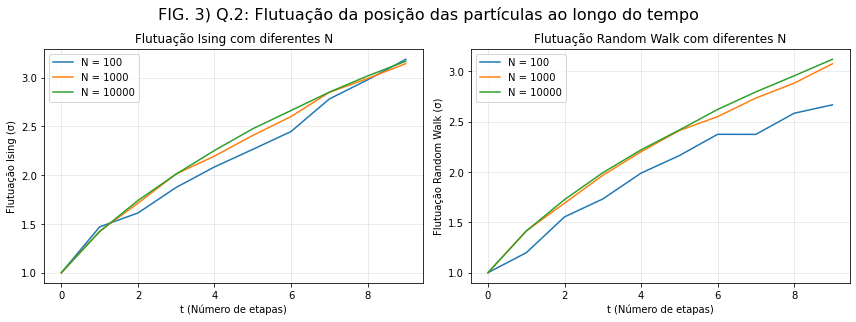

In [50]:
plota_desvio_padrao_gas(t_max = 10, valores_N = [100, 1_000, 10_000])

### t_max = 1000

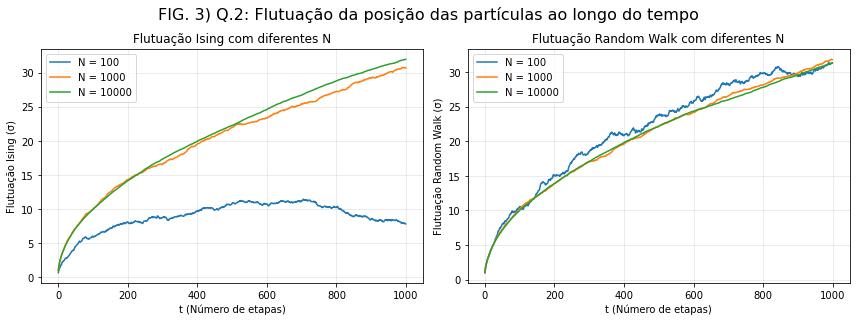

In [51]:
plota_desvio_padrao_gas(t_max = 1000, valores_N = [100, 1_000, 10_000])

### Simulando Gás com Modelo "box" (usando escopo dos slides da disciplina)

Flutuação (N = 100) =  0.050918001329195946
Flutuação (N = 1000) =  0.02918912014963795
Flutuação (N = 10000) =  0.07439686145550795


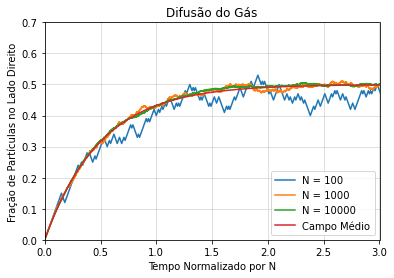

In [41]:
t = 100000

def difusao(N):
    box = [-1] * N
    Nd = 0
    particulas_difusas = []
    for j in range(1, t + 1):
        i = int(N * random.random())
        box[i] = -box[i]
        Nd += box[i]
        particulas_difusas.append(float(Nd)/N)
    return particulas_difusas

def campo_medio(N): 
    return [ ((1-np.exp(-2*(i+1)/N))*N/2)/N for i in range(1,t+1)]

for i in [2,3,4]:    
    plt.plot(np.arange(1, t+1) / (10**i), difusao(10**i), label='N = '+str(10**i))
    print('Flutuação (N = '+str(10**i)+') = ', np.std(difusao(10**i)) )

plt.plot(np.arange(1, t + 1)/(10000), campo_medio(10000), label="Campo Médio")
plt.xlabel(' Tempo Normalizado por N'); plt.ylabel('Fração de Partículas no Lado Direito'); plt.title('Difusão do Gás')
plt.xlim(0,3); plt.ylim(0,0.7); plt.grid(True, alpha=0.5); plt.legend(loc='lower right'); plt.show()

# Gif Simulação Gás confinado em uma caixa

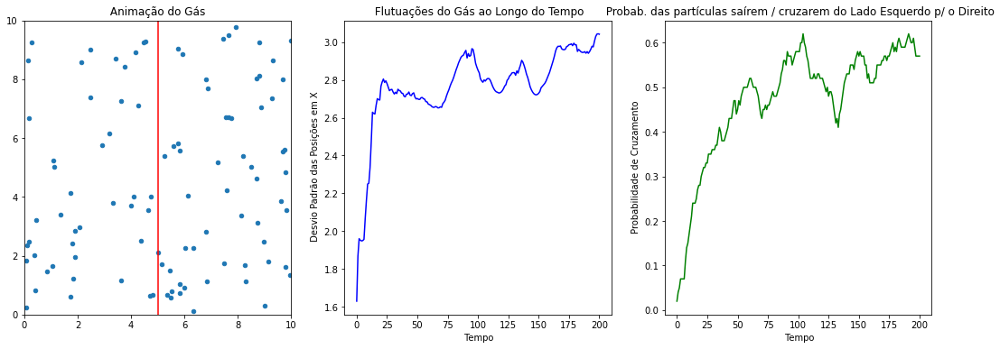

In [45]:
# pip install pillow
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# Parâmetros da simulação
num_particles = 100  # Número de partículas
container_size = 10.0  # Tamanho do recipiente

# Inicialização das posições e velocidades das partículas
positions = np.zeros((num_particles, 2))
positions[:, 0] = np.random.uniform(0, container_size / 2, num_particles)
velocities = np.random.randn(num_particles, 2)

# Lista para armazenar o desvio padrão ao longo do tempo
std_devs_list = []

# Lista para armazenar o desvio padrão ao longo do tempo
probabilities_list = []

# Função para atualizar as probabilidades de cruzamento
def update_positions(positions, velocities, dt):
    positions += velocities * dt
    positions %= container_size

# Função de animação
def animate(frame):
    plt.clf()
    
    # Subplot 1: Animação do gás
    plt.subplot(1, 3, 1)
    plt.xlim(0, container_size)
    plt.ylim(0, container_size)
    
    #Adicionar linha vermelha para representar a divisão
    plt.axvline(x=container_size / 2, color='r')
    
    update_positions(positions, velocities, 0.1)
    plt.scatter(positions[:, 0], positions[:, 1], s=20)
    plt.title(' Animação do Gás ')
    
    # Subplot 2: Flutuações do desvio padrão
    plt.subplot(1,3,2)
    std_dev = np.std(positions[:,0])
    std_devs_list.append(std_dev)
    plt.plot(std_devs_list, color='b')
    plt.xlabel(' Tempo')
    plt.ylabel(' Desvio Padrão das Posições em X')
    plt.title(' Flutuações do Gás ao Longo do Tempo')
    
    # Subplot 3: Probabilidade de cruzamento
    plt.subplot(1,3,3)
    prob = np.sum( positions[:,0] > container_size/2 ) / num_particles
    probabilities_list.append(prob)
    plt.plot(probabilities_list, color='g')
    plt.xlabel(' Tempo')
    plt.ylabel(' Probabilidade de Cruzamento')
    plt.title(' Probab. das partículas saírem / cruzarem do Lado Esquerdo p/ o Direito')
    
# Criação da figura
fig = plt.figure(figsize=(18,6))
ani = animation.FuncAnimation(fig, animate, frames=200, interval=50, blit=False)

# # Salvar a animação como um arquivo GIF
# ani.save('animacao_gas.gif', writer='pillow')

# Exibição da animação
from IPython.display import HTML
HTML(ani.to_jshtml())